# King County Housing Data

**Data:** Information on house sales in King County in Washington, USA. The information is given for may 2014 to may 2015. The data is examined for a stakeholder.

**Stakeholder:** 

| Information | Description    |
| ----------- | -------------- |
| name        | Nicole Johnson |
| role        | buyer          |
| demand      | Lively, central neighbourhood, middle price range, right timing (within a year) |

## Preface

### Package import

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats
import plotly.express as px
import seaborn as sns

### Original Data
Loading the data and basic information about it.

In [2]:
orig_data = pd.read_csv('../data/King_County_House_prices_dataset.csv')

In [3]:
orig_data.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,...,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,...,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,0.0,0.0,...,6,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,...,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,...,8,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503


In [4]:
orig_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   price          21597 non-null  float64
 3   bedrooms       21597 non-null  int64  
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  int64  
 6   sqft_lot       21597 non-null  int64  
 7   floors         21597 non-null  float64
 8   waterfront     19221 non-null  float64
 9   view           21534 non-null  float64
 10  condition      21597 non-null  int64  
 11  grade          21597 non-null  int64  
 12  sqft_above     21597 non-null  int64  
 13  sqft_basement  21597 non-null  object 
 14  yr_built       21597 non-null  int64  
 15  yr_renovated   17755 non-null  float64
 16  zipcode        21597 non-null  int64  
 17  lat            21597 non-null  float64
 18  long  

### Preprocessing

Changing the type of the date column to datetime

In [5]:
proc_data = orig_data.copy()
proc_data.loc[:,'date'] = pd.to_datetime(proc_data.loc[:,'date'].str.strip(), format='%m/%d/%Y')
proc_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   id             21597 non-null  int64         
 1   date           21597 non-null  datetime64[ns]
 2   price          21597 non-null  float64       
 3   bedrooms       21597 non-null  int64         
 4   bathrooms      21597 non-null  float64       
 5   sqft_living    21597 non-null  int64         
 6   sqft_lot       21597 non-null  int64         
 7   floors         21597 non-null  float64       
 8   waterfront     19221 non-null  float64       
 9   view           21534 non-null  float64       
 10  condition      21597 non-null  int64         
 11  grade          21597 non-null  int64         
 12  sqft_above     21597 non-null  int64         
 13  sqft_basement  21597 non-null  object        
 14  yr_built       21597 non-null  int64         
 15  yr_renovated   1775

## Filtering Data

### Filter by Location

Ms. Johnson wants a house in a central and lively neighbourhood.

#### Getting to know the data

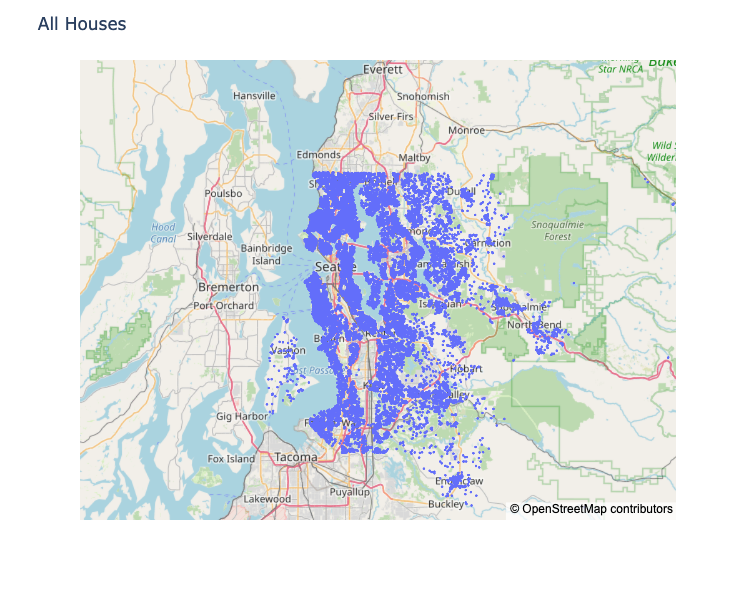

In [6]:
#Show all houses on map
fig = px.scatter_mapbox(proc_data, lat=proc_data.lat, lon=proc_data.long, hover_name="id", width=600, height=600)
fig.update_layout(title = 'All Houses', mapbox_style="open-street-map")
fig.update_geos(fitbounds="locations")
fig.update_traces(marker=dict(size=3))
fig.show()

In [7]:
# How many zipcodes are present in the data
proc_data['zipcode'].nunique()

70

#### Filter for central houses using zipcodes

Ms. Johnson wants a house in a central and lively neighbourhood. All houses in rural areas, the island and the edge of the city are filtered out, as they are not relevant for her.

In [8]:
#Zipcodes that are considered a central location. Seattle is considered central in all zipcodes. 
#Other cities are considered central if the structure doesn't look suburban. 
#Rural areas and islands are not considered central.
seattle_zipcodes = [98101, 98102, 98103, 98104, 98105, 98106, 98107, 98108, 98109, 98110, 98111, 98112, 98114, 
                    98115, 98116, 98117, 98118, 98119, 98121, 98122, 98124, 98125, 98126, 98129, 98131, 98132, 
                    98133, 98134, 98136, 98138, 98144, 98145, 98146, 98148, 98151, 98154, 98155, 98158, 98160, 
                    98161, 98164, 98166, 98168, 98170, 98171, 98174, 98177, 98178, 98181, 98184, 98185, 98188, 
                    98190, 98191, 98195, 98198, 98199]
other_central_zipcodes = [98033, 98034, 98004, 98005, 98007, 98057, 98030, 98031, 
                         98198, 98166, 98146, 98168, 98148, 98158, 98188]
central_zipcodes = seattle_zipcodes + other_central_zipcodes
len(central_zipcodes)

72

In [9]:
#Filter houses on the island and the suburbs and rurals out
centralzip_data = proc_data.query('zipcode == @central_zipcodes')
centralzip_data['zipcode'].nunique()

36

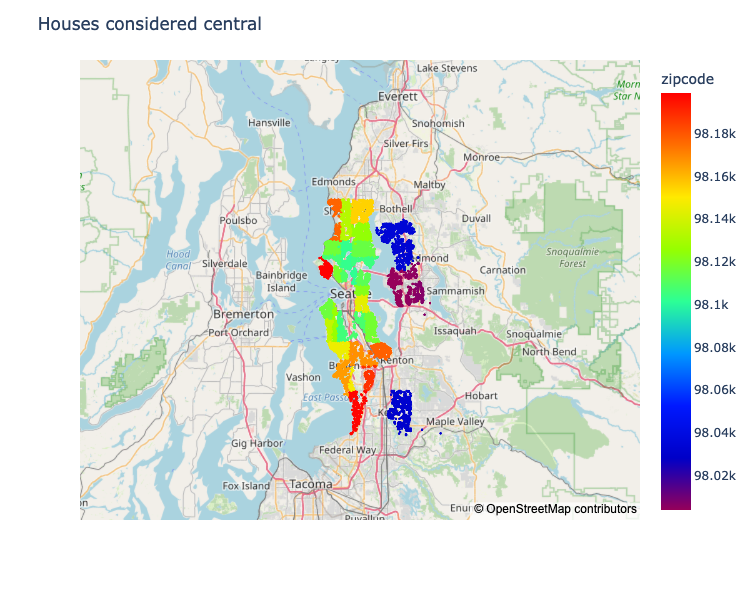

In [10]:
#plot filtered houses on the map
fig = px.scatter_mapbox(centralzip_data, lat=centralzip_data.lat, lon=centralzip_data.long, 
                        color='zipcode', hover_name="id", width=600, height=600, color_continuous_scale="Rainbow")
fig.update_layout(title = 'Houses considered central', mapbox_style="open-street-map")
fig.update_geos(fitbounds="locations")
fig.update_traces(marker=dict(size=3))
fig.show()

### Getting to know the central data

Examining the location filtered data to find out which criteria are relevant for further filtering.

In [11]:
centralzip_data.head(10)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,2014-10-13,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,...,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,6414100192,2014-12-09,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,...,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
3,2487200875,2014-12-09,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,...,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000
7,2008000270,2015-01-15,291850.0,3,1.50,1060,9711,1.0,0.0,NaN,...,7,1060,0.0,1963,0.0,98198,47.4095,-122.315,1650,9711
8,2414600126,2015-04-15,229500.0,3,1.00,1780,7470,1.0,0.0,0.0,...,7,1050,730.0,1960,0.0,98146,47.5123,-122.337,1780,8113
10,1736800520,2015-04-03,662500.0,3,2.50,3560,9796,1.0,NaN,0.0,...,8,1860,1700.0,1965,0.0,98007,47.6007,-122.145,2210,8925
11,9212900260,2014-05-27,468000.0,2,1.00,1160,6000,1.0,0.0,0.0,...,7,860,300.0,1942,0.0,98115,47.6900,-122.292,1330,6000
14,1175000570,2015-03-12,530000.0,5,2.00,1810,4850,1.5,0.0,0.0,...,7,1810,0.0,1900,0.0,98107,47.6700,-122.394,1360,4850
15,9297300055,2015-01-24,650000.0,4,3.00,2950,5000,2.0,0.0,3.0,...,9,1980,970.0,1979,0.0,98126,47.5714,-122.375,2140,4000
17,6865200140,2014-05-29,485000.0,4,1.00,1600,4300,1.5,0.0,0.0,...,7,1600,0.0,1916,0.0,98103,47.6648,-122.343,1610,4300


#### Footage of the home

In [12]:
centralzip_data['sqft_living'].describe()

count    11105.000000
mean      1884.025664
std        850.735796
min        370.000000
25%       1290.000000
50%       1710.000000
75%       2290.000000
max      12050.000000
Name: sqft_living, dtype: float64

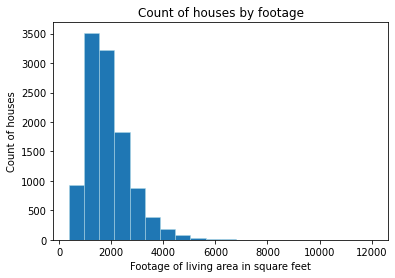

In [13]:
#Show Living Area
fig, ax = plt.subplots()
ax.hist(centralzip_data['sqft_living'], bins=20, linewidth=0.5, edgecolor='lightblue')
ax.set_xlabel('Footage of living area in square feet')
ax.set_ylabel('Count of houses')
ax.set_title('Count of houses by footage')
plt.show()

#### checking out categorical columns

In [14]:
centralzip_data['bedrooms'].unique()

array([ 3,  4,  2,  5,  1,  6,  7,  8,  9, 11, 10, 33])

In [15]:
centralzip_data['bathrooms'].unique()

array([1.  , 2.25, 3.  , 1.5 , 2.5 , 2.  , 1.75, 2.75, 3.25, 3.5 , 0.75,
       4.  , 4.5 , 3.75, 4.25, 1.25, 5.25, 5.  , 0.5 , 5.5 , 4.75, 6.75,
       6.  , 8.  , 7.5 , 6.25, 5.75])

#### Pairplot

Examine the correlations

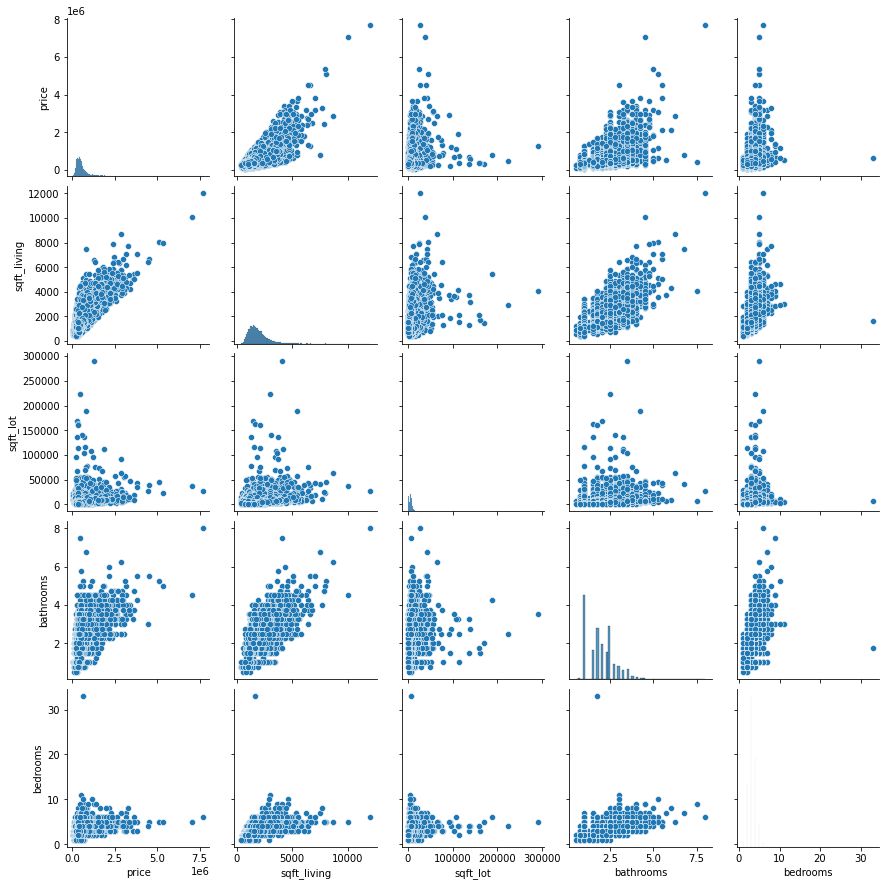

In [16]:
sns.pairplot(centralzip_data[['price', 'sqft_living', 'sqft_lot', 'bathrooms', 'bedrooms']])

#### Group by date

In [17]:
mean_date = centralzip_data.groupby('date').mean()
mean_date.sort_values('date')
mean_date.reset_index(inplace=True)
mean_date.head()

,date,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,2014-05-02,4.193301e+09,616757.000000,3.200000,1.983333,1853.000000,6194.100000,1.500000,0.0,0.300000,3.600000,7.666667,1566.333333,1959.466667,86.695652,98116.200000,47.640207,-122.319967,1810.666667,5899.700000
1,2014-05-03,8.132700e+09,553000.000000,2.000000,1.000000,900.000000,5000.000000,1.000000,0.0,0.000000,3.000000,7.000000,900.000000,1944.000000,0.000000,98117.000000,47.688300,-122.395000,1280.000000,5000.000000
2,2014-05-04,6.916101e+09,705750.000000,3.500000,2.250000,2565.000000,6570.000000,1.500000,0.0,0.000000,3.000000,8.500000,1565.000000,1940.000000,0.000000,98122.000000,47.603200,-122.289000,2260.000000,6329.500000
3,2014-05-05,4.456250e+09,574733.600000,3.333333,1.955556,1873.533333,7565.577778,1.522222,0.0,0.111111,3.644444,7.533333,1527.533333,1959.288889,132.166667,98113.533333,47.640773,-122.303178,1709.066667,6036.288889
4,2014-05-06,4.419875e+09,553582.954545,3.272727,2.079545,1886.363636,6998.227273,1.375000,0.0,0.181818,3.250000,7.409091,1470.000000,1959.931818,390.222222,98118.568182,47.639125,-122.317545,1714.318182,6704.795455


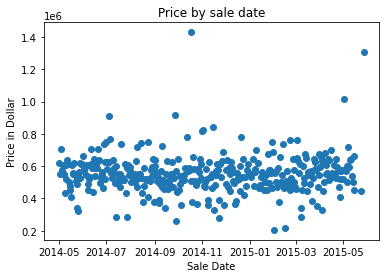

In [18]:
#Show
fig, ax = plt.subplots()
ax.scatter(mean_date['date'], y=mean_date['price'])
ax.set_xlabel('Sale Date')
ax.set_ylabel('Price in Dollar')
ax.set_title('Price by sale date')
plt.show()

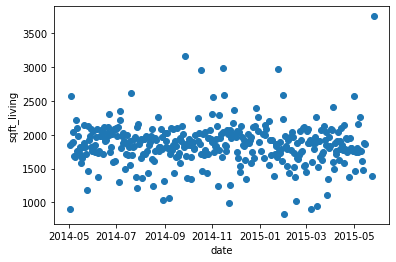

In [19]:
#Show
fig, ax = plt.subplots()
ax.scatter(mean_date['date'], y=mean_date['sqft_living'])
#ax.hist(filtered_data['date'])
ax.set_xlabel('date')
ax.set_ylabel('sqft_living')
#ax.set_xticks(ax.get_xticks()[::20])
plt.show()

**_NOTE:_** No correlation found! The selling date doesn't influence the price.

This won't be further considered during filtering.

#### Group by footage of the home

In [20]:
mean_livingarea = centralzip_data.groupby('sqft_living').mean()
mean_livingarea.sort_values('sqft_living')
mean_livingarea.reset_index(inplace=True)
mean_livingarea.head()

,sqft_living,id,price,bedrooms,bathrooms,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,370,2.856101e+09,276000.0,1.0,0.750,1801.0,1.0,0.0,0.0,5.0,5.0,370.0,1923.0,0.0,98117.0,47.67780,-122.389,1340.0,5000.0
1,380,1.723049e+09,245000.0,1.0,0.750,15000.0,1.0,0.0,0.0,3.0,5.0,380.0,1963.0,0.0,98168.0,47.48100,-122.323,1170.0,15000.0
2,390,9.266700e+09,245000.0,1.0,1.000,2000.0,1.0,0.0,0.0,4.0,6.0,390.0,1920.0,0.0,98103.0,47.69380,-122.347,1340.0,5100.0
3,410,6.303400e+09,325000.0,1.0,0.750,8636.0,1.0,0.0,0.0,2.0,4.0,410.0,1953.0,0.0,98146.0,47.50770,-122.357,1190.0,8636.0
4,420,5.936001e+09,254525.0,1.0,0.875,5009.0,1.0,0.0,0.0,3.5,4.5,420.0,1935.5,0.0,98122.0,47.54475,-122.351,1440.0,5847.5


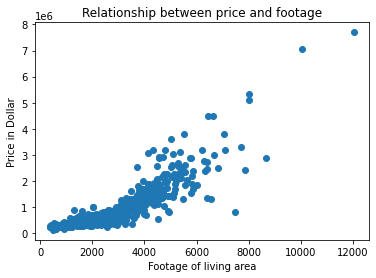

In [21]:
#Show
fig, ax = plt.subplots()
ax.scatter(mean_livingarea['sqft_living'], y=mean_livingarea['price'])
ax.set_xlabel('Footage of living area')
ax.set_ylabel('Price in Dollar')
ax.set_title('Relationship between price and footage')
plt.show()

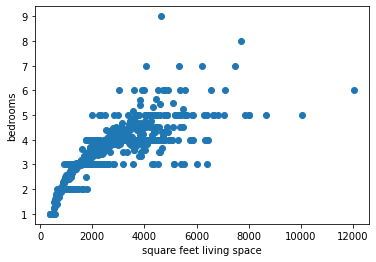

In [22]:
#Show
fig, ax = plt.subplots()
ax.scatter(mean_livingarea['sqft_living'], y=mean_livingarea['bedrooms'])
#ax.hist(filtered_data['date'])
ax.set_xlabel('square feet living space')
ax.set_ylabel('bedrooms')
#ax.set_xticks(ax.get_xticks()[::20])
plt.show()

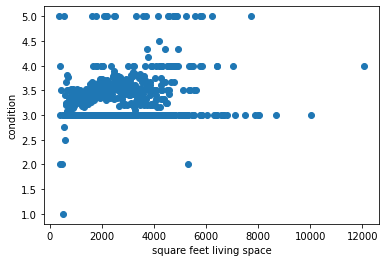

In [23]:
#Show
fig, ax = plt.subplots()
ax.scatter(mean_livingarea['sqft_living'], y=mean_livingarea['condition'])
#ax.hist(filtered_data['date'])
ax.set_xlabel('square feet living space')
ax.set_ylabel('condition')
#ax.set_xticks(ax.get_xticks()[::20])
plt.show()

#### Group by number of bedrooms

In [24]:
mean_beds = centralzip_data.groupby('bedrooms').mean()
mean_beds.sort_values('bedrooms')
mean_beds.reset_index(inplace=True)
mean_beds.head()

,bedrooms,id,price,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,1,4.378380e+09,322484.924138,1.048276,845.931034,5694.875862,1.151724,0.007812,0.200000,3.165517,6.227586,786.620690,1938.827586,154.491379,98128.648276,47.591874,-122.336614,1401.310345,5545.779310
1,2,4.561266e+09,410828.638612,1.348312,1186.423680,5564.398003,1.314788,0.007503,0.164044,3.367570,6.854969,1040.378982,1950.517356,82.777582,98126.101759,47.612183,-122.330631,1464.487874,5472.991916
2,3,4.541948e+09,508794.602626,1.900303,1721.305657,6966.969697,1.471818,0.005699,0.245088,3.422626,7.392525,1438.355758,1962.640808,98.345707,98112.652525,47.610533,-122.305795,1709.293737,6661.406667
3,4,4.589545e+09,683330.446575,2.301199,2364.791096,8765.387671,1.499486,0.008809,0.365946,3.533562,7.821575,1877.343836,1960.329452,148.991210,98105.544178,47.608514,-122.290884,2000.022260,8036.716438
4,5,4.381307e+09,819384.574578,2.635863,2832.949416,10597.571984,1.513619,0.012950,0.406494,3.499351,8.011673,2128.778210,1961.434501,134.628527,98102.079118,47.613631,-122.284533,2143.355383,9032.417639


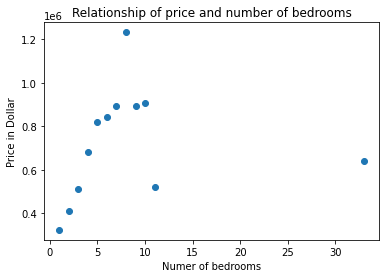

In [25]:
#Show
fig, ax = plt.subplots()
ax.scatter(mean_beds['bedrooms'], y=mean_beds['price'])
ax.set_xlabel('Numer of bedrooms')
ax.set_ylabel('Price in Dollar')
ax.set_title('Relationship of price and number of bedrooms')
plt.show()

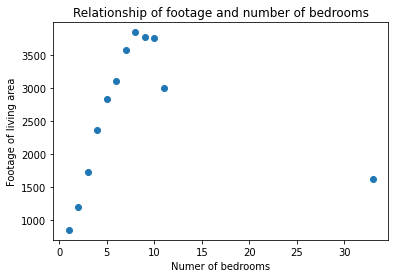

In [26]:
#Show
fig, ax = plt.subplots()
ax.scatter(mean_beds['bedrooms'], y=mean_beds['sqft_living'])
ax.set_xlabel('Numer of bedrooms')
ax.set_ylabel('Footage of living area')
ax.set_title('Relationship of footage and number of bedrooms')
plt.show()

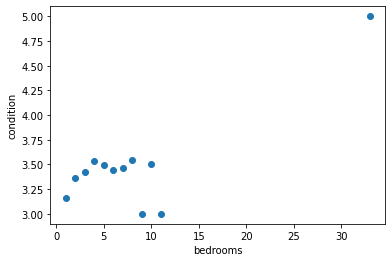

In [27]:
#Show
fig, ax = plt.subplots()
ax.scatter(mean_beds['bedrooms'], y=mean_beds['condition'])
#ax.hist(filtered_data['date'])
ax.set_xlabel('bedrooms')
ax.set_ylabel('condition')
#ax.set_xticks(ax.get_xticks()[::20])
plt.show()

#### Group by bathrooms

In [28]:
mean_baths = centralzip_data.groupby('bathrooms').mean()
mean_baths.sort_values('bathrooms')
mean_baths.reset_index(inplace=True)
mean_baths.head()

,bathrooms,id,price,bedrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,0.50,6.362967e+09,212333.333333,1.666667,880.000000,5430.666667,1.000000,0.000000,0.00000,3.333333,5.666667,556.666667,1932.000000,0.000000,98133.000000,47.618567,-122.316667,1453.333333,5669.333333
1,0.75,4.245803e+09,310118.000000,1.897436,923.333333,8129.384615,1.089744,0.027027,0.25641,3.307692,5.948718,842.820513,1942.948718,70.928571,98133.333333,47.571474,-122.324821,1482.051282,7092.384615
2,1.00,4.554047e+09,376950.262325,2.583303,1177.269162,6879.626844,1.128823,0.002437,0.09816,3.364879,6.614250,1077.197193,1939.580784,60.222024,98126.548399,47.604037,-122.321963,1453.056135,6570.330694
3,1.25,3.183313e+09,543243.750000,2.375000,1490.000000,4590.500000,1.937500,0.000000,0.62500,3.375000,8.000000,1251.250000,1984.500000,0.000000,98107.125000,47.621688,-122.284750,1593.750000,5139.375000
4,1.50,4.623560e+09,452582.627066,2.978306,1536.556818,6813.855372,1.436467,0.000000,0.15735,3.386364,7.198347,1324.267562,1956.921488,51.852357,98118.549587,47.609164,-122.310820,1605.571281,6176.501033


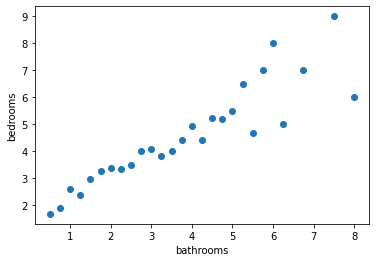

In [29]:
#Show
fig, ax = plt.subplots()
ax.scatter(mean_baths['bathrooms'], y=mean_baths['bedrooms'])
ax.set_xlabel('bathrooms')
ax.set_ylabel('bedrooms')
plt.show()

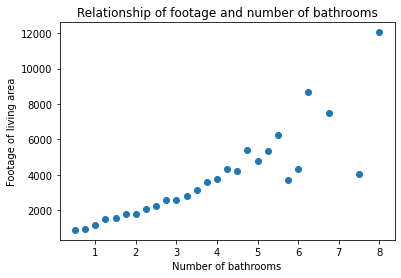

In [30]:
#Show
fig, ax = plt.subplots()
ax.scatter(mean_baths['bathrooms'], y=mean_baths['sqft_living'])
ax.set_xlabel('Number of bathrooms')
ax.set_ylabel('Footage of living area')
ax.set_title('Relationship of footage and number of bathrooms')
plt.show()

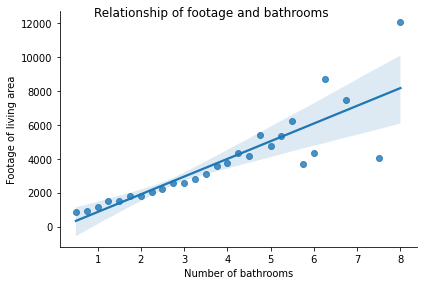

In [31]:
corr_bath_footage = sns.lmplot(x="bathrooms", y="sqft_living", data=mean_baths, height=4, aspect=1.5)
corr_bath_footage.set_axis_labels("Number of bathrooms", "Footage of living area")
corr_bath_footage.fig.suptitle("Relationship of footage and bathrooms")
plt.show()

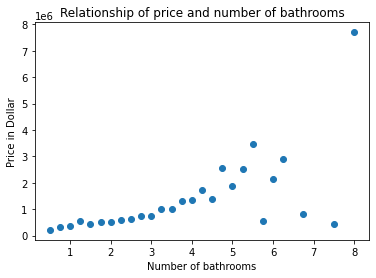

In [32]:
#Show
fig, ax = plt.subplots()
ax.scatter(mean_baths['bathrooms'], y=mean_baths['price'])
#ax.hist(filtered_data['date'])
ax.set_xlabel('Number of bathrooms')
ax.set_ylabel('Price in Dollar')
ax.set_title('Relationship of price and number of bathrooms')
plt.show()

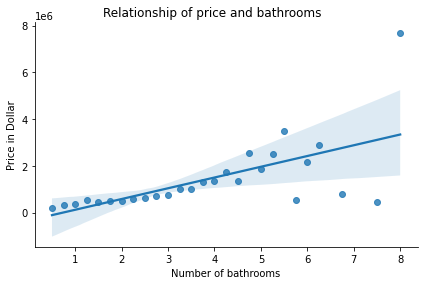

In [33]:
corr_bath_price = sns.lmplot(x="bathrooms", y="price", data=mean_baths, height=4, aspect=1.5)
corr_bath_price.set_axis_labels("Number of bathrooms", "Price in Dollar")
corr_bath_price.fig.suptitle("Relationship of price and bathrooms")
plt.show()

#### Group by condition

In [34]:
centralzip_data['condition'].unique()

array([3, 5, 4, 2, 1])

In [35]:
mean_condition = centralzip_data.groupby('condition').mean()
mean_condition.sort_values('condition')
mean_condition.reset_index(inplace=True)
mean_condition.head()

,condition,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,grade,sqft_above,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,1,4.984231e+09,359759.523810,2.523810,1.154762,1225.714286,9117.809524,1.190476,0.052632,0.428571,5.952381,1178.095238,1923.333333,132.800000,98119.142857,47.580824,-122.322810,1767.619048,7577.333333
1,2,4.008038e+09,339012.601942,2.718447,1.327670,1258.834951,10048.048544,1.135922,0.011236,0.048544,6.378641,1146.699029,1939.213592,0.000000,98124.349515,47.565772,-122.309301,1458.757282,7179.368932
2,3,4.547465e+09,543917.683519,3.220223,2.018173,1869.300628,7031.754499,1.554699,0.007372,0.255974,7.536847,1571.111397,1967.709654,153.494665,98114.242788,47.608733,-122.306595,1750.337332,6589.494002
3,4,4.536942e+09,572808.413518,3.281456,1.819584,1877.327210,8566.622184,1.259445,0.007425,0.318372,7.281456,1475.637435,1947.247487,51.630815,98106.626343,47.610046,-122.298220,1817.795841,7914.827383
4,5,4.575800e+09,676832.662706,3.464351,2.083638,2067.434186,7255.080439,1.331353,0.008273,0.322018,7.392139,1523.980804,1938.493601,43.546154,98117.289762,47.627741,-122.315455,1829.174589,6877.384826


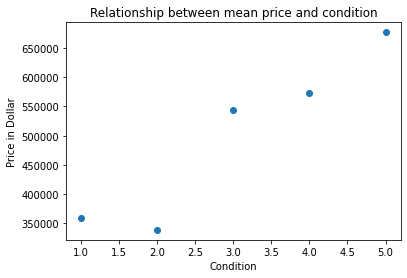

In [36]:
#Show
fig, ax = plt.subplots()
ax.scatter(mean_condition['condition'], y=mean_condition['price'])
ax.set_xlabel('Condition')
ax.set_ylabel('Price in Dollar')
ax.set_title('Relationship between mean price and condition')
plt.show()

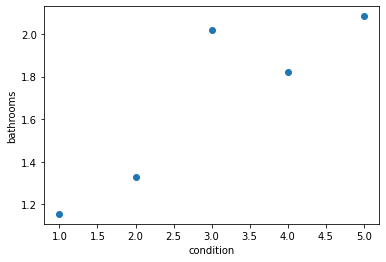

In [37]:
#Show
fig, ax = plt.subplots()
ax.scatter(mean_condition['condition'], y=mean_condition['bathrooms'])
#ax.hist(filtered_data['date'])
ax.set_xlabel('condition')
ax.set_ylabel('bathrooms')
#ax.set_xticks(ax.get_xticks()[::20])
plt.show()

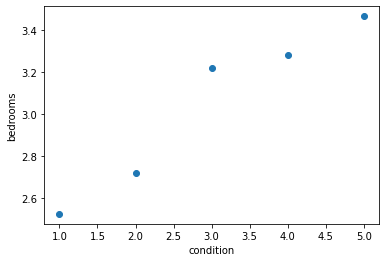

In [38]:
#Show
fig, ax = plt.subplots()
ax.scatter(mean_condition['condition'], y=mean_condition['bedrooms'])
#ax.hist(filtered_data['date'])
ax.set_xlabel('condition')
ax.set_ylabel('bedrooms')
#ax.set_xticks(ax.get_xticks()[::20])
plt.show()

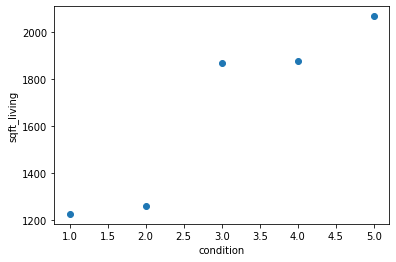

In [39]:
#Show
fig, ax = plt.subplots()
ax.scatter(mean_condition['condition'], y=mean_condition['sqft_living'])
#ax.hist(filtered_data['date'])
ax.set_xlabel('condition')
ax.set_ylabel('sqft_living')
#ax.set_xticks(ax.get_xticks()[::20])
plt.show()

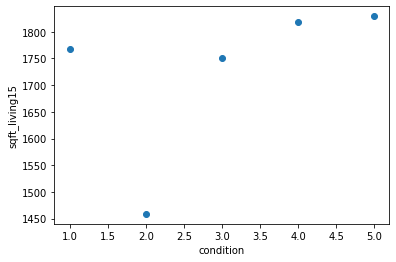

In [40]:
#Show
fig, ax = plt.subplots()
ax.scatter(mean_condition['condition'], y=mean_condition['sqft_living15'])
#ax.hist(filtered_data['date'])
ax.set_xlabel('condition')
ax.set_ylabel('sqft_living15')
#ax.set_xticks(ax.get_xticks()[::20])
plt.show()

In [41]:
centralzip_data.groupby('condition').count()['id']

condition
1      21
2     103
3    7002
4    2885
5    1094
Name: id, dtype: int64

In [42]:
condition_test = centralzip_data.groupby('condition').describe()['price']
condition_test

,count,mean,std,min,25%,50%,75%,max
condition,,,,,,,,
1,21.0,359759.523810,311804.986177,78000.0,130000.0,295000.0,441000.0,1500000.0
2,103.0,339012.601942,278889.282883,82500.0,190187.5,285000.0,422775.0,2560000.0
3,7002.0,543917.683519,385329.206878,82000.0,329810.0,445000.0,625000.0,7060000.0
4,2885.0,572808.413518,369063.138462,107000.0,357500.0,485000.0,675000.0,7700000.0
5,1094.0,676832.662706,424195.564061,140000.0,417750.0,588000.0,778000.0,3650000.0


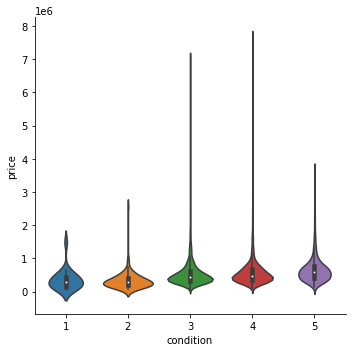

In [43]:
violinplot = sns.catplot(x="condition", y="price", kind="violin", data=centralzip_data)

#### Group by price

In [44]:
centralzip_data.groupby('price').count()['id']

price
78000.0      1
81000.0      1
82000.0      1
82500.0      1
83000.0      1
            ..
4500000.0    1
5110000.0    1
5350000.0    1
7060000.0    1
7700000.0    1
Name: id, Length: 2364, dtype: int64

In [45]:
mean_price = centralzip_data.groupby('price').mean()
mean_price.sort_values('price')
mean_price.reset_index(inplace=True)
mean_price.head()

,price,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,78000.0,4.000036e+07,2.0,1.0,780.0,16344.0,1.0,0.0,0.0,1.0,5.0,780.0,1942.0,NaN,98168.0,47.4739,-122.280,1700.0,10387.0
1,81000.0,3.028200e+09,2.0,1.0,730.0,9975.0,1.0,NaN,0.0,1.0,5.0,730.0,1943.0,0.0,98168.0,47.4808,-122.315,860.0,9000.0
2,82000.0,3.883800e+09,3.0,1.0,860.0,10426.0,1.0,0.0,0.0,3.0,6.0,860.0,1954.0,0.0,98146.0,47.4987,-122.341,1140.0,11250.0
3,82500.0,1.623049e+09,2.0,1.0,520.0,22334.0,1.0,0.0,0.0,2.0,5.0,520.0,1951.0,0.0,98168.0,47.4799,-122.296,1572.0,10570.0
4,83000.0,7.999600e+09,2.0,1.0,900.0,8580.0,1.0,0.0,0.0,3.0,5.0,900.0,1918.0,0.0,98168.0,47.4727,-122.270,2060.0,6533.0


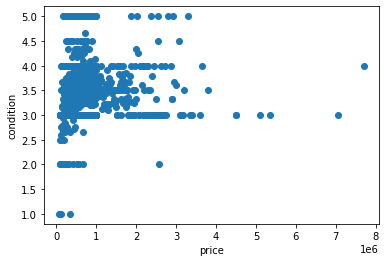

In [46]:
#Show
fig, ax = plt.subplots()
ax.scatter(mean_price['price'], y=mean_price['condition'])
#ax.hist(filtered_data['date'])
ax.set_xlabel('price')
ax.set_ylabel('condition')
#ax.set_xticks(ax.get_xticks()[::20])
plt.show()

### Filtering data using different criteria

Condition, number of bedrooms, number of bathrooms, year built or renovated

#### Only houses with condition 4

Houses with condition 3 and 4 show similar properties like price and footage. Since houses with condition 4 are better, only these are considered.
Houses with condition 5 have a higher price.

In [47]:
centralzip_data['condition'].unique()

array([3, 5, 4, 2, 1])

In [48]:
#Filter with condition 3 or 4
filtered_data = centralzip_data[(centralzip_data['condition'] == 4)]
filtered_data['condition'].describe()

count    2885.0
mean        4.0
std         0.0
min         4.0
25%         4.0
50%         4.0
75%         4.0
max         4.0
Name: condition, dtype: float64

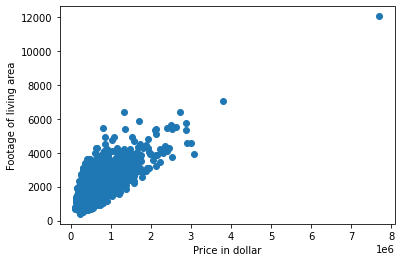

In [49]:
#Show relationship between price and footage
fig, ax = plt.subplots()
ax.scatter(filtered_data['price'], y=filtered_data['sqft_living'])
ax.set_xlabel('Price in dollar')
ax.set_ylabel('Footage of living area')
plt.show()

#### Only houses with max 3 bedrooms

She probably has no kids, as she didn't mention this. So she doesn't need a huge house with many bedrooms.

In [50]:
filtered_data['bedrooms'].unique()

array([ 2,  4,  3,  5,  6,  1,  7,  8, 10])

In [51]:
filtered_data['bedrooms'].describe()

count    2885.000000
mean        3.281456
std         0.978170
min         1.000000
25%         3.000000
50%         3.000000
75%         4.000000
max        10.000000
Name: bedrooms, dtype: float64

In [52]:
#Filter with max 3 bedrooms
filtered_data = filtered_data[filtered_data['bedrooms'] <= 3]
filtered_data['bedrooms'].describe()

count    1827.000000
mean        2.671045
std         0.504795
min         1.000000
25%         2.000000
50%         3.000000
75%         3.000000
max         3.000000
Name: bedrooms, dtype: float64

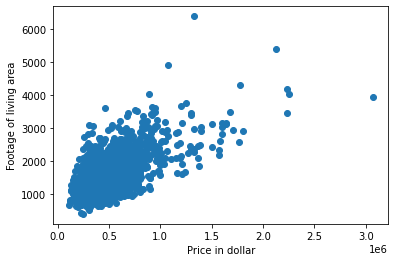

In [53]:
#Show relationship between price and footage
fig, ax = plt.subplots()
ax.scatter(filtered_data['price'], y=filtered_data['sqft_living'])
ax.set_xlabel('Price in dollar')
ax.set_ylabel('Footage of living area')
plt.show()

#### Only houses with 1 to 3 bathrooms

She needs at least one bathroom, but there don't have to be more bathrooms than bedrooms.

In [54]:
filtered_data['bathrooms'].unique()

array([1.  , 2.25, 1.75, 2.  , 2.5 , 1.5 , 3.  , 3.25, 1.25, 3.5 , 4.25,
       2.75, 3.75, 0.5 , 0.75, 4.  ])

In [55]:
#Filter with 1 to 3 bathrooms
filtered_data = filtered_data[(filtered_data['bathrooms'] >= 1) & (filtered_data['bathrooms'] <= 3)]
filtered_data['bathrooms'].describe()

count    1798.000000
mean        1.560762
std         0.544959
min         1.000000
25%         1.000000
50%         1.500000
75%         2.000000
max         3.000000
Name: bathrooms, dtype: float64

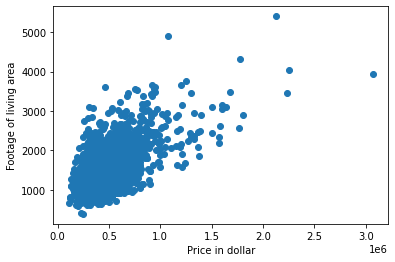

In [56]:
#Show relationship between price and footage
fig, ax = plt.subplots()
ax.scatter(filtered_data['price'], y=filtered_data['sqft_living'])
ax.set_xlabel('Price in dollar')
ax.set_ylabel('Footage of living area')
plt.show()

In [57]:
filtered_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1798 entries, 11 to 21567
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   id             1798 non-null   int64         
 1   date           1798 non-null   datetime64[ns]
 2   price          1798 non-null   float64       
 3   bedrooms       1798 non-null   int64         
 4   bathrooms      1798 non-null   float64       
 5   sqft_living    1798 non-null   int64         
 6   sqft_lot       1798 non-null   int64         
 7   floors         1798 non-null   float64       
 8   waterfront     1596 non-null   float64       
 9   view           1790 non-null   float64       
 10  condition      1798 non-null   int64         
 11  grade          1798 non-null   int64         
 12  sqft_above     1798 non-null   int64         
 13  sqft_basement  1798 non-null   object        
 14  yr_built       1798 non-null   int64         
 15  yr_renovated   1454

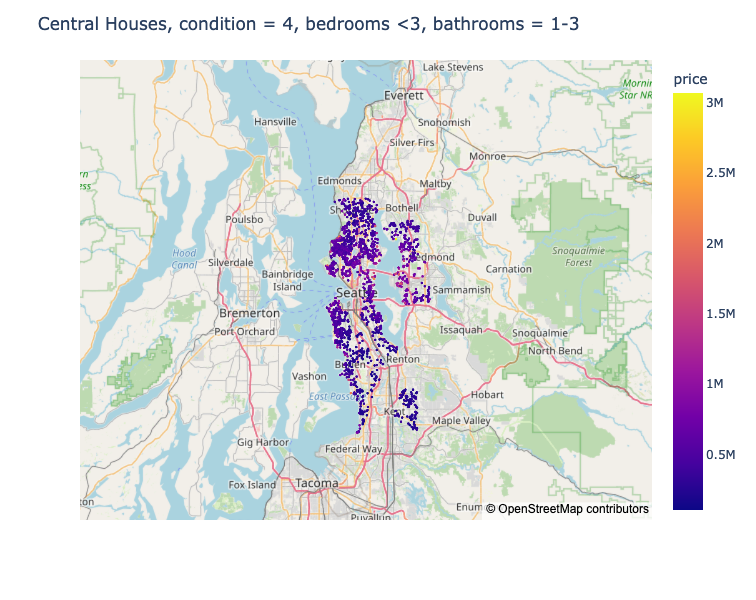

In [58]:
#plot filtered houses on the map
fig = px.scatter_mapbox(filtered_data, lat=filtered_data.lat, lon=filtered_data.long, 
                     hover_name='id', color='price', width=600, height=600)
fig.update_layout(title = 'Central Houses, condition = 4, bedrooms <3, bathrooms = 1-3', mapbox_style="open-street-map")
fig.update_geos(fitbounds='locations')
fig.update_traces(marker=dict(size=3))
fig.show()

#### Only houses built and renovated after 1975 (within the last 40 years)

In [59]:
filtered_data.sort_values('yr_built')['yr_built'].unique()

array([1900, 1901, 1902, 1903, 1904, 1905, 1906, 1907, 1908, 1909, 1910,
       1911, 1912, 1913, 1914, 1915, 1916, 1917, 1918, 1919, 1920, 1921,
       1922, 1923, 1924, 1925, 1926, 1927, 1928, 1929, 1930, 1931, 1932,
       1933, 1934, 1935, 1936, 1937, 1938, 1939, 1940, 1941, 1942, 1943,
       1944, 1945, 1946, 1947, 1948, 1949, 1950, 1951, 1952, 1953, 1954,
       1955, 1956, 1957, 1958, 1959, 1960, 1961, 1962, 1963, 1964, 1965,
       1966, 1967, 1968, 1969, 1970, 1971, 1972, 1973, 1974, 1975, 1976,
       1977, 1978, 1979, 1980, 1981, 1982, 1983, 1984, 1985, 1986, 1987,
       1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 2000,
       2001, 2005, 2006])

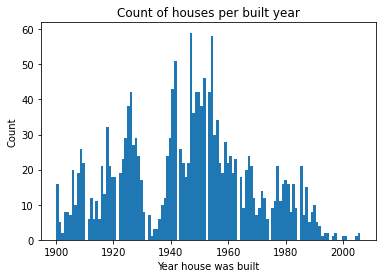

In [60]:
#Show histogram of years the houses were built
fig, ax = plt.subplots()
ax.hist(filtered_data['yr_built'], bins=116)
ax.set_xlabel('Year house was built')
ax.set_ylabel('Count')
ax.set_title('Count of houses per built year')
plt.show()

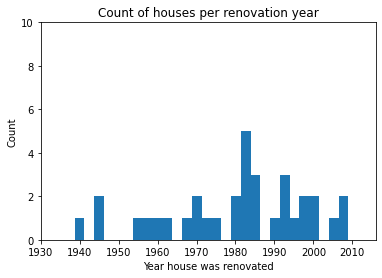

In [61]:
#Show histogram of years the houses were renovated
fig, ax = plt.subplots()
ax.hist(filtered_data['yr_renovated'], bins=800)
ax.set_xlabel('Year house was renovated')
ax.set_ylabel('Count')
ax.set(xlim=(1930,2016), ylim=(0,10))
ax.set_title('Count of houses per renovation year')
plt.show()

In [62]:
#Filter built or renovated within the last 40 years
filtered_data = filtered_data[(filtered_data['yr_built'] >= 1975) | (filtered_data['yr_renovated'] >= 1975)]
filtered_data['yr_built'].describe()

count     245.000000
mean     1978.644898
std        16.501876
min      1900.000000
25%      1977.000000
50%      1981.000000
75%      1986.000000
max      2006.000000
Name: yr_built, dtype: float64

In [63]:
filtered_data['yr_renovated'].describe()

count     207.000000
mean      221.188406
std       627.139986
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max      2009.000000
Name: yr_renovated, dtype: float64

### Filtering by house prices
Ms. Johnson wants a house in the middle price range

In [64]:
filtered_data['price'].describe(percentiles=[0.25,0.40,0.60,0.75])

count    2.450000e+02
mean     4.949359e+05
std      2.840023e+05
min      1.499000e+05
25%      2.800000e+05
40%      3.599800e+05
50%      4.260000e+05
60%      4.754000e+05
75%      6.200000e+05
max      2.130000e+06
Name: price, dtype: float64

Anything above the 75-Percentile is not interesting to Ms. Johnson.

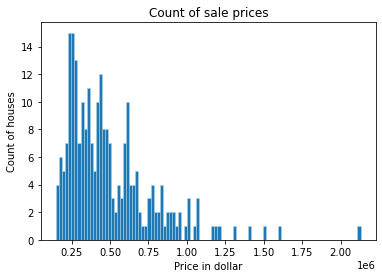

In [65]:
#Show histogram of house prices
fig, ax = plt.subplots()
ax.hist(filtered_data['price'], bins=100, linewidth=0.5, edgecolor='lightblue')
ax.set_xlabel('Price in dollar')
ax.set_ylabel('Count of houses')
ax.set_title('Count of sale prices')
plt.show()

#### Filtering for medium priced houses

Ms. Johnson is interested in medium priced houses, therefore only the central houses within the 40-percentile and the 60-percentile are included.

In [66]:
#save the percentiles to variables to filter later
price40 = filtered_data['price'].describe(percentiles=[0.40])['40%']
price60 = filtered_data['price'].describe(percentiles=[0.60])['60%']

In [67]:
#Filter using the interquartiles range calculated before
price_central_data = filtered_data[(filtered_data['price'] > price40) & (filtered_data['price'] < price60)]
price_central_data['price'].describe()

count        49.000000
mean     422446.448980
std       32693.758103
min      360000.000000
25%      405000.000000
50%      426000.000000
75%      445000.000000
max      475000.000000
Name: price, dtype: float64

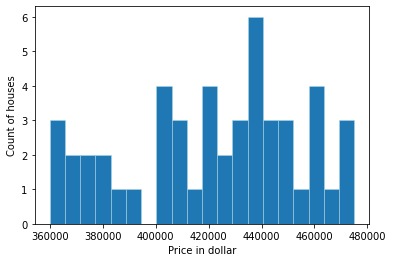

In [68]:
#Show houses that are within the filtered range
fig, ax = plt.subplots()
ax.hist(price_central_data['price'], bins=20, linewidth=0.5, edgecolor='lightblue')
ax.set_xlabel('Price in dollar')
ax.set_ylabel('Count of houses')
plt.show()

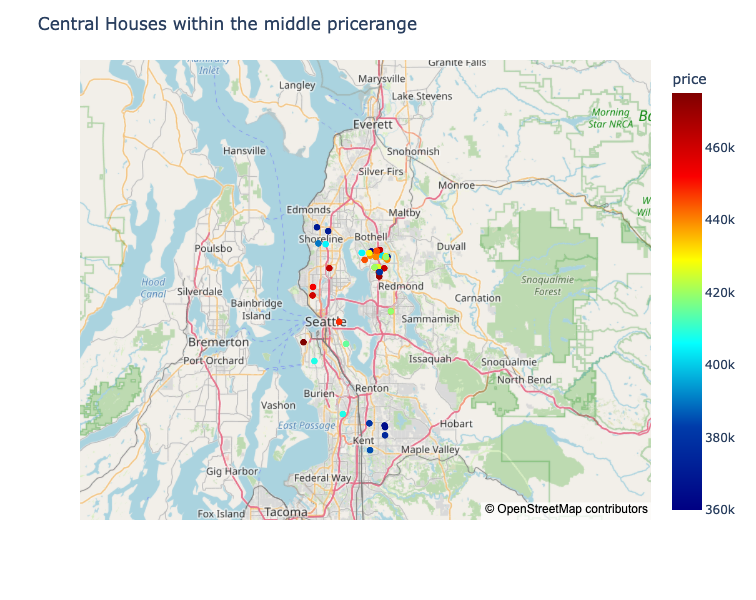

In [69]:
#plot filtered houses on the map
fig = px.scatter_mapbox(price_central_data, lat=price_central_data.lat, lon=price_central_data.long, 
                     hover_name='id', color='price', width=600, height=600, color_continuous_scale="Jet")
fig.update_layout(title = 'Central Houses within the middle pricerange', mapbox_style="open-street-map")
fig.update_geos(fitbounds='locations')
fig.update_traces(marker=dict(size=7))
fig.show()

## Finding best houses by filtered data

### checking out filtered data

In [70]:
price_central_data.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,4.900000e+01,49.000000,49.000000,49.000000,49.000000,49.000000,49.000000,40.0,49.000000,49.0,49.000000,49.000000,49.000000,45.000000,49.000000,49.000000,49.000000,49.000000,49.000000
mean,4.463757e+09,422446.448980,2.836735,2.086735,1692.857143,9757.673469,1.346939,0.0,0.081633,4.0,7.265306,1405.918367,1981.428571,44.577778,98055.244898,47.660839,-122.222592,1725.102041,7158.530612
std,2.900154e+09,32693.758103,0.373438,0.359220,316.977917,15844.926056,0.480929,0.0,0.448922,0.0,0.490557,312.109211,12.614476,299.036824,44.589578,0.110463,0.070157,304.447056,3023.725814
min,7.220590e+08,360000.000000,2.000000,1.500000,1140.000000,1339.000000,1.000000,0.0,0.000000,4.0,6.000000,700.000000,1908.000000,0.000000,98007.000000,47.363700,-122.393000,1360.000000,1281.000000
25%,2.423020e+09,405000.000000,3.000000,1.750000,1470.000000,5649.000000,1.000000,0.0,0.000000,4.0,7.000000,1210.000000,1977.000000,0.000000,98033.000000,47.621400,-122.233000,1500.000000,5449.000000
50%,2.783600e+09,426000.000000,3.000000,2.250000,1590.000000,7482.000000,1.000000,0.0,0.000000,4.0,7.000000,1340.000000,1982.000000,0.000000,98034.000000,47.703400,-122.192000,1610.000000,7560.000000
75%,6.918730e+09,445000.000000,3.000000,2.500000,1850.000000,8560.000000,2.000000,0.0,0.000000,4.0,8.000000,1530.000000,1986.000000,0.000000,98034.000000,47.728700,-122.171000,1950.000000,8515.000000
max,9.477201e+09,475000.000000,3.000000,2.750000,2470.000000,114127.000000,2.000000,0.0,3.000000,4.0,8.000000,2470.000000,2006.000000,2006.000000,98188.000000,47.776700,-122.153000,2510.000000,14479.000000


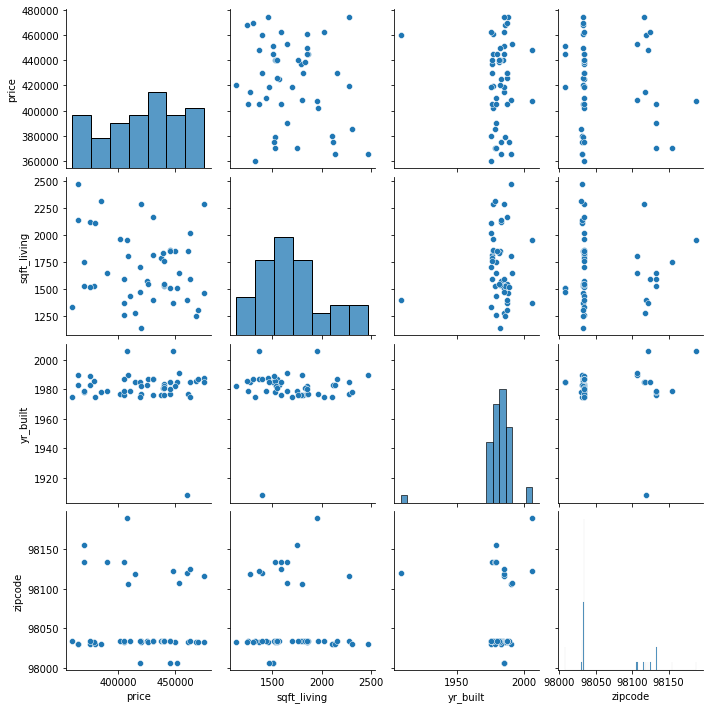

In [71]:
sns.pairplot(price_central_data[['price', 'sqft_living', 'yr_built', 'zipcode']])

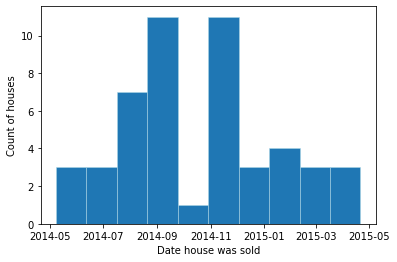

In [72]:
#Show houses that are below 1,000,000 Dollars
fig, ax = plt.subplots()
ax.hist(price_central_data['date'], linewidth=0.5, edgecolor='lightblue')
#ax.set(xlim=(0,1000000))
ax.set_xlabel('Date house was sold')
ax.set_ylabel('Count of houses')
plt.show()

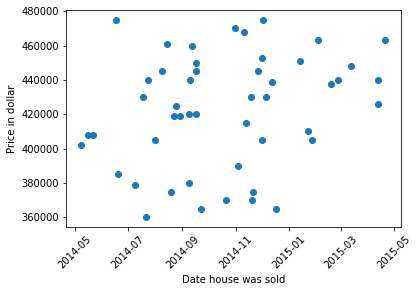

In [73]:
#Show
fig, ax = plt.subplots()
ax.scatter(price_central_data['date'], y=price_central_data['price'])
#ax.hist(filtered_data['date'])
ax.set_xlabel('Date house was sold')
ax.set_ylabel('Price in dollar')
ax.tick_params(axis='x', labelrotation=45)
plt.show()

### Finding best houses

3 most popular zipcodes of the filtered houses are filtered for the houses close or at the medium of price.

In [74]:
zipcode_mean = price_central_data.groupby('zipcode').count()['price']
top_zipcodes = zipcode_mean.sort_values(ascending=False).head(3)
top_zipcodes

zipcode
98034    20
98033     9
98031     4
Name: price, dtype: int64

In [75]:
top_zipcodes.index[1]

98033

In [76]:
zip1 = price_central_data[(price_central_data['zipcode'] == top_zipcodes.index[0])].copy()
median_price_zip1 = zip1['price'].median()
house_zip1 = zip1[(zip1['price'] == median_price_zip1)]
if house_zip1.shape[0] == 0:
    zip1.sort_values('price', inplace=True)
    house_zip1 = zip1[int(len(zip1.index)/2-1):int(len(zip1.index)/2+1)]
    
#len(zip2.index)/2
house_zip1

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
1093,9477201040,2014-11-18,430000.0,3,1.75,1810,7300,1.0,NaN,0.0,...,7,1240,570.0,1976,0.0,98034,47.7299,-122.192,1460,7560
17961,2125410210,2014-12-06,430000.0,3,2.25,2160,6527,2.0,0.0,0.0,...,7,1580,580.0,1987,0.0,98034,47.7292,-122.212,1950,9675
18885,6386200100,2014-07-18,430000.0,3,2.50,1400,7508,2.0,0.0,0.0,...,7,1400,0.0,1987,0.0,98034,47.7233,-122.167,1710,7700


In [77]:
zip2 = price_central_data[(price_central_data['zipcode'] == top_zipcodes.index[1])].copy()
median_price_zip2 = zip2['price'].median()
house_zip2 = zip2[(zip2['price'] == median_price_zip2)]

if house_zip2.shape[0] == 0:
    zip2.sort_values('price', inplace=True)
    house_zip2 = zip2[int(len(zip2.index)/2-1):int(len(zip2.index)/2+1)]
    
#len(zip2.index)/2
house_zip2

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
6158,3039000020,2014-09-16,450000.0,3,1.75,1850,8667,1.0,NaN,0.0,...,7,880,970.0,1982,NaN,98033,47.7025,-122.198,1450,10530


In [78]:
zip3 = price_central_data[(price_central_data['zipcode'] == top_zipcodes.index[2])].copy()
median_price_zip3 = zip3['price'].median()
house_zip3 = zip3[(zip3['price'] == median_price_zip3)]
if house_zip3.shape[0] == 0:
    zip3.sort_values('price', inplace=True)
    house_zip3 = zip3[int(len(zip3.index)/2-1):int(len(zip3.index)/2+1)]
    
#len(zip2.index)/2
house_zip3

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
14257,922059161,2014-09-22,365000.0,3,2.00,2140,26600,1.0,0.0,0.0,...,7,2140,0.0,1983,NaN,98031,47.4066,-122.169,2310,8783
544,7800800160,2014-11-21,375000.0,3,2.25,2120,18500,2.0,NaN,0.0,...,8,2120,0.0,1983,0.0,98031,47.3914,-122.169,2120,14479


## Final recommendations of houses to buy

In [79]:
recommendations = pd.concat([house_zip1, house_zip2, house_zip3])
recommendations

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
1093,9477201040,2014-11-18,430000.0,3,1.75,1810,7300,1.0,NaN,0.0,...,7,1240,570.0,1976,0.0,98034,47.7299,-122.192,1460,7560
17961,2125410210,2014-12-06,430000.0,3,2.25,2160,6527,2.0,0.0,0.0,...,7,1580,580.0,1987,0.0,98034,47.7292,-122.212,1950,9675
18885,6386200100,2014-07-18,430000.0,3,2.50,1400,7508,2.0,0.0,0.0,...,7,1400,0.0,1987,0.0,98034,47.7233,-122.167,1710,7700
6158,3039000020,2014-09-16,450000.0,3,1.75,1850,8667,1.0,NaN,0.0,...,7,880,970.0,1982,NaN,98033,47.7025,-122.198,1450,10530
14257,922059161,2014-09-22,365000.0,3,2.00,2140,26600,1.0,0.0,0.0,...,7,2140,0.0,1983,NaN,98031,47.4066,-122.169,2310,8783
544,7800800160,2014-11-21,375000.0,3,2.25,2120,18500,2.0,NaN,0.0,...,8,2120,0.0,1983,0.0,98031,47.3914,-122.169,2120,14479


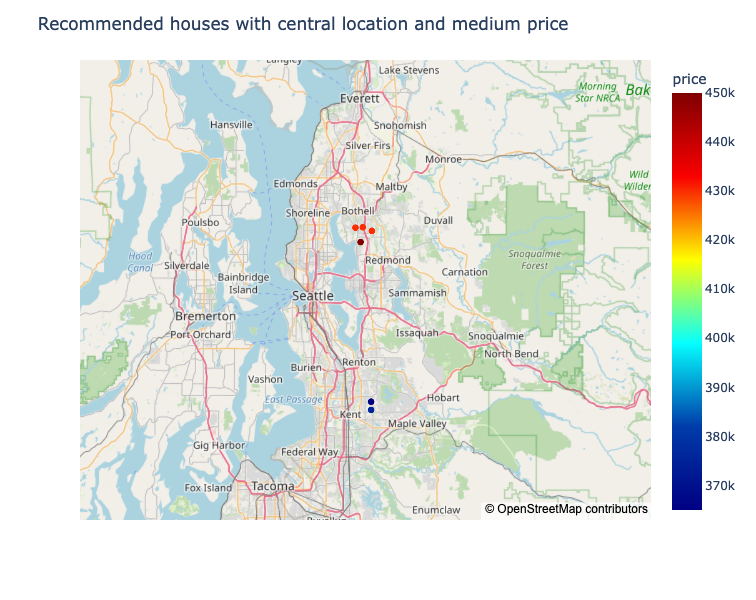

In [80]:
#plot filtered houses on the map
fig = px.scatter_mapbox(recommendations, lat=recommendations.lat, lon=recommendations.long, 
                     hover_name='id', color='price', width=600, height=600, color_continuous_scale="Jet")
fig.update_layout(title = 'Recommended houses with central location and medium price', mapbox_style="open-street-map")
fig.update_geos(fitbounds='locations')
fig.update_traces(marker=dict(size=7))
fig.show()